In [1]:
import numpy as np
import pandas as pd
import vectorbt as vbt
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas_ta as ta
import yfinance as yf 
import warnings
import plotly.graph_objects as go
from plotly.subplots import make_subplots
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
%matplotlib inline

### Load Data

In [2]:
# BTC Full
btc = pd.read_csv('2022.2.9BTCUSDT-H1-NoSession.csv')
btc.Date = btc.Date.astype(str)+' '+ btc.Time
btc.Date = pd.to_datetime(btc.Date)
btc.drop(columns= ['Time'], inplace = True)
btc = btc.set_index('Date')

In [3]:
# EURUSD Full
df = pd.read_csv('2022.2.9EURUSD-H4-NoSession.csv')
df.Date = df.Date.astype(str)+' '+ df.Time
df.Date = pd.to_datetime(df.Date)
df.drop(columns= ['Time'], inplace = True)
df = df.set_index('Date')

##### Trend, Non-Trend Data

In [4]:
dftr1 = pd.read_csv('TRE_EURUSD_2011_2015.csv', index_col = 'Date')
dftr2 = pd.read_csv('TRE_EURUSD_2017_2018.csv', index_col = 'Date')
# ------------------------------------------------------------------
dfsw1 = pd.read_csv('SW_EURUSD_2015_2017_4H.csv', index_col = 'Date')
dfsw2 = pd.read_csv('SW_EURUSD_2010_2014_4H.csv', index_col = 'Date')

### Util Function

In [5]:
#initial
def set_up_df(df:pd.DataFrame , index):  
    df1    =   pd.DataFrame(columns=index)
    df1['date']  =    df.index 
    df1.date = pd.to_datetime(df1.date,format='%Y-%m-%d')
    df1 = df1.set_index('date')
    return df1

#for calculate duration
def convert_to_hours(delta):
    total_seconds = delta.total_seconds()
    hours = str(int(total_seconds // 3600))
    return hours

#Performance Matric
def cal_consecutive(df:pd.DataFrame):
    df['win']= np.sign(df) # assign sign on log
    blocks = df['win'].ne(df['win'].shift()).cumsum() 
    df['consecutive_WL'] = df['win'].groupby(blocks).cumsum()
    return df['consecutive_WL'] 

def Cal_portstat(port):
    port_return = port.total_return().to_frame()
    port_return['MaxDD'] = port.max_drawdown()
    port_return['NumTrade'] = port.trades.count()
    port_return['WinRate'] = port.trades.win_rate()
    port_return['AvgWinningTrade'] = port.trades.winning.returns.mean()
    port_return['AvgLosingTrade'] = port.trades.losing.returns.mean()
    port_return['SharpRatio'] = port.returns_acc.sharpe_ratio()
    return port_return

def Cal_pip(df):
    pip = []
    pipp = df['Avg Exit Price'] - df['Avg Entry Price']
    for i in portfinal['Direction']:
        if i == 'Long':
            pip.append(1)
        else :
            pip.append(-1)    
    return (pip * pipp) 

def Cal_mae_mfe(data,port):
    MAE = []
    MFE = []
    for i,j,y,k in zip(port['Entry Timestamp'], port['Exit Timestamp'], port['Avg Entry Price'], port['Direction']):
        if k == 'Long':
            MFE.append((data.loc[i:j]['High'].max() - y)/y)
            MAE.append((y - df.loc[i:j]['Low'].min())/y)
        else :
            MAE.append((data.loc[i:j]['High'].max() - y)/y)
            MFE.append((y - df.loc[i:j]['Low'].min())/y)
    return MAE, MFE  

def Calkelly(port):
    init_cash = 10000
    W = port.stats()[15]/100
    A = abs(port.stats()[19])
    B = port.stats()[18]
    Percent_kelly = (W/A) - ((1-W)/B)
    riskpertrade = Percent_kelly * init_cash
    print(f'Percent_kelly = {Percent_kelly}')


### Define Strategy Function

In [20]:
def strategy(df, willr = 21, ema = 150):
    df['wil'] = df.ta.willr(willr)
    df['ema'] = df.ta.ema(ema)
    

    l1 = df['wil'].vbt.crossed_above(-20)
    l2 = df.Close > df['ema'] 
    df['long_signal'] = l1 & l2

    s1 = df['wil'].vbt.crossed_below(-80) 
    s2 = df.Close < df['ema']
    df['short_signal'] = s1 & s2

    df['long_exit'] = s1
    df['short_exit'] = l1

    return df

### Run Default

In [21]:
def run_strategy(df, timeframe = '1h', cash = 10000):
    df = strategy(df)
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = df['long_signal'],
                                    exits = df['long_exit'],
                                    short_entries = df['short_signal'],
                                    short_exits = df['short_exit'],
                                    freq = timeframe,
                                    init_cash = cash,
                                    fees = 0.00,
                                    slippage = 0.00)
    return port

In [22]:
run_strategy(df).stats()

Start                               2003-05-05 00:00:00
End                                 2022-02-07 20:00:00
Period                               1262 days 00:00:00
Start Value                                     10000.0
End Value                                   8814.126501
Total Return [%]                             -11.858735
Benchmark Return [%]                           2.004244
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                              33.011266
Max Drawdown Duration                 882 days 18:00:00
Total Trades                                        741
Total Closed Trades                                 740
Total Open Trades                                     1
Open Trade PnL                                -1.694876
Win Rate [%]                                  36.756757
Best Trade [%]                                 8.615934
Worst Trade [%]                               -2

In [23]:
run_strategy(df).value().vbt.plot()

FigureWidget({
    'data': [{'showlegend': False,
              'type': 'scatter',
              'uid': 'f652b…

### Optimise with SL

In [24]:
def run_strategy_sl(df, timeframe = '1h', cash = 10000, multiply = 1):
    df = strategy(df)
    df['vol'] = df.ta.stdev().ewm(alpha=0.96).mean()
    df['sl_stop'] = (df['vol'] * multiply) / df.Close
    
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = df['long_signal'],
                                    exits = df['long_exit'] ,
                                    short_entries = df['short_signal'],
                                    short_exits = df['short_exit'],
                                    freq = timeframe,
                                    init_cash = cash,
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

# Optimise Vol Multiply
portstats = []
start, end, step = (0.1, 4, 0.1)
array = np.arange(start,end,step)
for i in array:
    port = run_strategy_sl(df, multiply = i)
    portstats.append(port.stats())
pd.DataFrame(portstats).sort_values('Sharpe Ratio',ascending=False).head(5)   

,Start,End,Period,Start Value,End Value,Total Return [%],Benchmark Return [%],Max Gross Exposure [%],Total Fees Paid,Max Drawdown [%],...,Avg Winning Trade [%],Avg Losing Trade [%],Avg Winning Trade Duration,Avg Losing Trade Duration,Profit Factor,Expectancy,Sharpe Ratio,Calmar Ratio,Omega Ratio,Sortino Ratio
9,2003-05-05,2022-02-07 20:00:00,1262 days,10000.0,10659.409625,6.594096,2.004244,100.0,0.0,23.554652,...,1.097272,-0.451047,1 days 21:57:52.941176470,0 days 10:35:22.613065326,1.021746,0.776361,0.194498,0.079139,1.008285,0.276728
10,2003-05-05,2022-02-07 20:00:00,1262 days,10000.0,10653.792130,6.537921,2.004244,100.0,0.0,21.866027,...,1.097637,-0.471978,1 days 22:07:15.937500,0 days 11:12:02.513089005,1.021897,0.791123,0.193414,0.084540,1.008195,0.275206
11,2003-05-05,2022-02-07 20:00:00,1262 days,10000.0,10345.855256,3.458553,2.004244,100.0,0.0,22.195504,...,1.093258,-0.493487,1 days 22:13:43.255813953,0 days 11:40:53.956834532,1.011623,0.427328,0.142313,0.044524,1.005989,0.202498
12,2003-05-05,2022-02-07 20:00:00,1262 days,10000.0,10143.737691,1.437377,2.004244,100.0,0.0,22.871179,...,1.092263,-0.516130,1 days 22:29:46.153846153,0 days 12:19:15.473098330,1.004863,0.182338,0.108468,0.018085,1.004521,0.153969
6,2003-05-05,2022-02-07 20:00:00,1262 days,10000.0,10104.793422,1.047934,2.004244,100.0,0.0,23.598214,...,1.070166,-0.379020,1 days 20:48:28.800000,0 days 08:22:51.428571428,1.003699,0.113188,0.098856,0.012796,1.004328,0.140126


In [26]:
run_strategy_sl(df, multiply = 1).stats()

Start                               2003-05-05 00:00:00
End                                 2022-02-07 20:00:00
Period                               1262 days 00:00:00
Start Value                                     10000.0
End Value                                  10659.409625
Total Return [%]                               6.594096
Benchmark Return [%]                           2.004244
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                              23.554652
Max Drawdown Duration                 710 days 05:00:00
Total Trades                                        853
Total Closed Trades                                 852
Total Open Trades                                     1
Open Trade PnL                                -2.049707
Win Rate [%]                                  29.929577
Best Trade [%]                                 8.615934
Worst Trade [%]                               -2

In [27]:
run_strategy_sl(df, multiply = 1).value().vbt.plot()

FigureWidget({
    'data': [{'showlegend': False,
              'type': 'scatter',
              'uid': 'bd084…

### Optimise with SL + fix riskpertrade

In [28]:
#if reach stoploss price it will loss 1% of cash 
def run_strategy_sl_fixRPT(df, timeframe = '1h', cash = 10000, multiply = 1, riskpertrade = 0.01):
    df = strategy(df)
    df['vol'] = df.ta.stdev().ewm(alpha=0.96).mean()
    df['sl_stop'] = (df['vol'] * multiply) / df.Close
    df['size'] = ((riskpertrade * cash)/df['sl_stop'])/ df.Close
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = df['long_signal'],
                                    exits = df['long_exit'] ,
                                    short_entries = df['short_signal'],
                                    short_exits = df['short_exit'],
                                    freq = timeframe,
                                    init_cash = cash, size = df['size'],
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

In [29]:
run_strategy_sl_fixRPT(df).stats()

Start                               2003-05-05 00:00:00
End                                 2022-02-07 20:00:00
Period                               1262 days 00:00:00
Start Value                                     10000.0
End Value                                  15904.719129
Total Return [%]                              59.047191
Benchmark Return [%]                           2.004244
Max Gross Exposure [%]                     20515.564716
Total Fees Paid                                     0.0
Max Drawdown [%]                              37.423138
Max Drawdown Duration                 433 days 11:00:00
Total Trades                                        853
Total Closed Trades                                 852
Total Open Trades                                     1
Open Trade PnL                                -2.511235
Win Rate [%]                                  29.929577
Best Trade [%]                                 8.615934
Worst Trade [%]                               -2

In [30]:
run_strategy_sl_fixRPT(df).value().vbt.plot()

FigureWidget({
    'data': [{'showlegend': False,
              'type': 'scatter',
              'uid': '918b2…

#### Trend Data 1

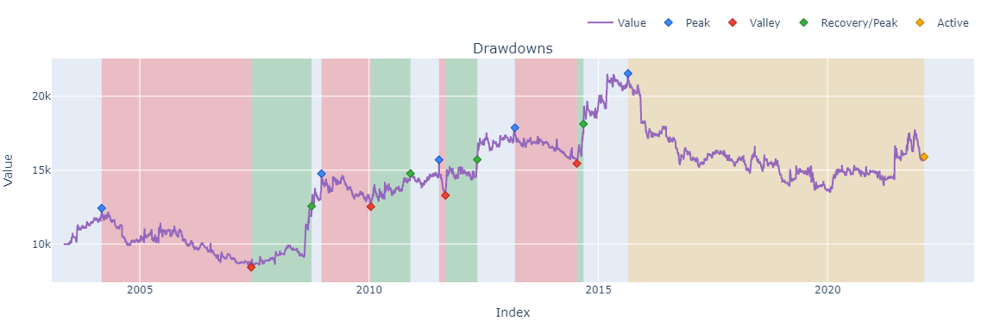

In [31]:
run_strategy_sl_fixRPT(df).plot(subplots=['drawdowns']).show() # Equity Curve

### Strategy test with Trend Period

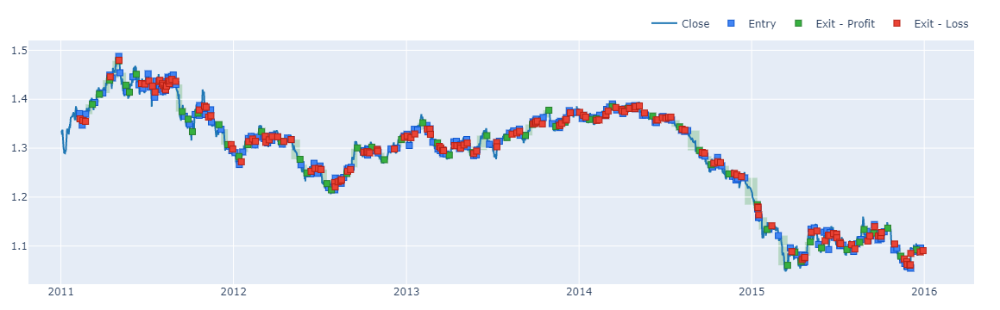

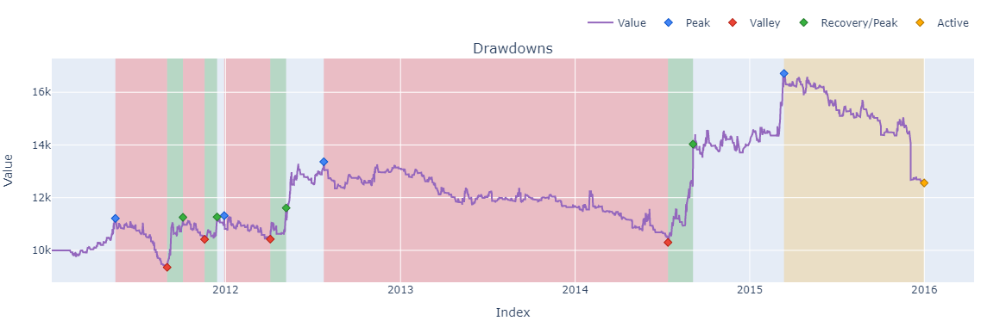

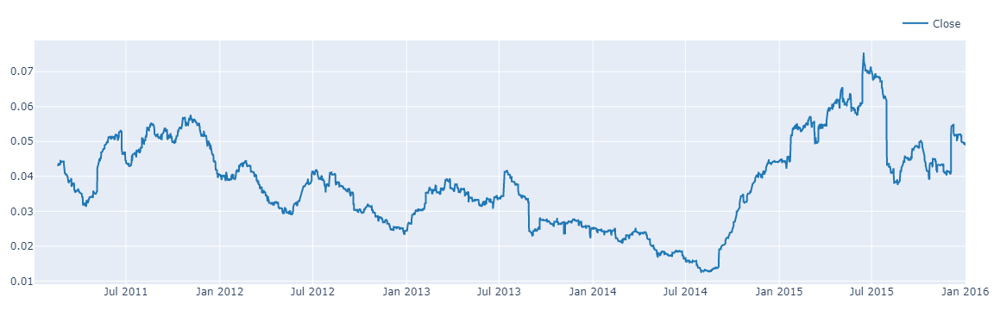

In [32]:
dftr1 = strategy(dftr1)
fig = dftr1.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl_fixRPT(dftr1).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl_fixRPT(dftr1).plot(subplots=['drawdowns']).show()
(np.log(dftr1.Close/dftr1.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility

####  Trend Data 2

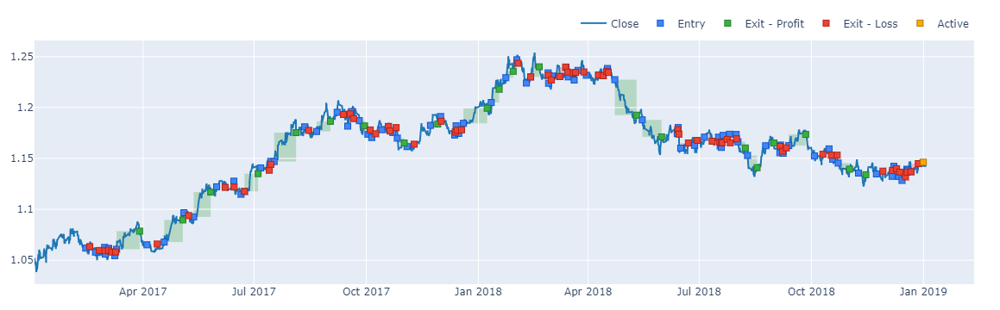

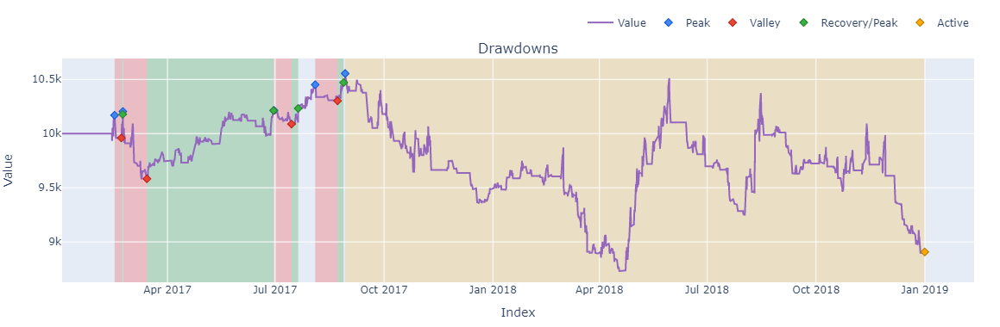

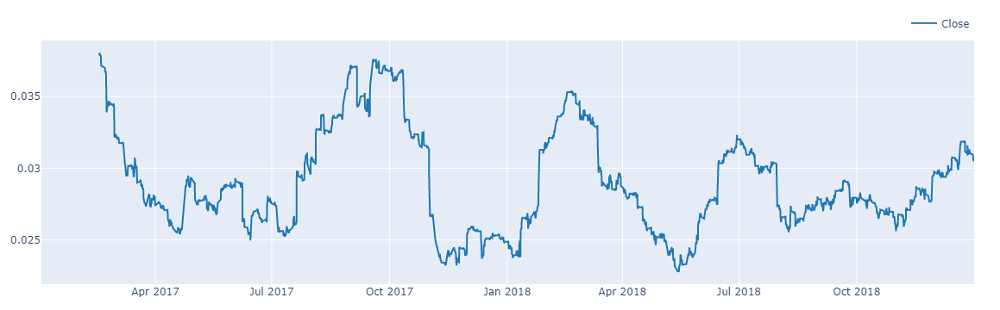

In [33]:
dftr2 = strategy(dftr2)
fig = dftr2.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl_fixRPT(dftr2).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl_fixRPT(dftr2).plot(subplots=['drawdowns']).show()
(np.log(dftr2.Close/dftr2.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility

### Strategy test with non-Trend Period

####  Non-Trend Data 1

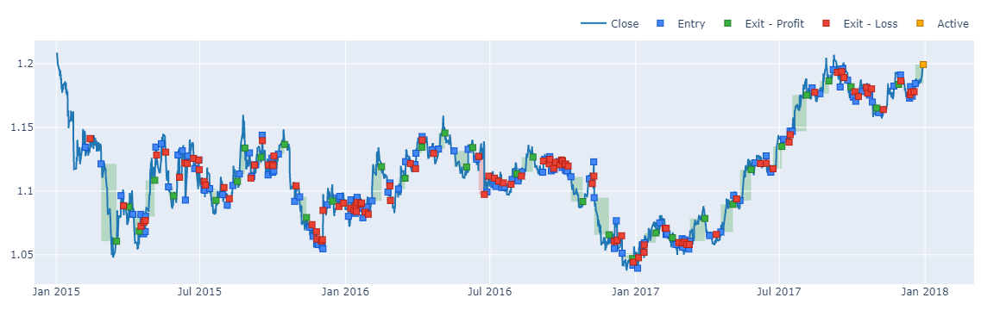

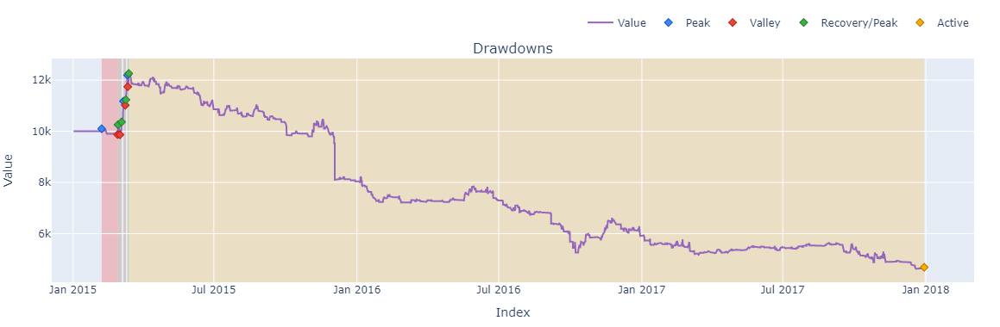

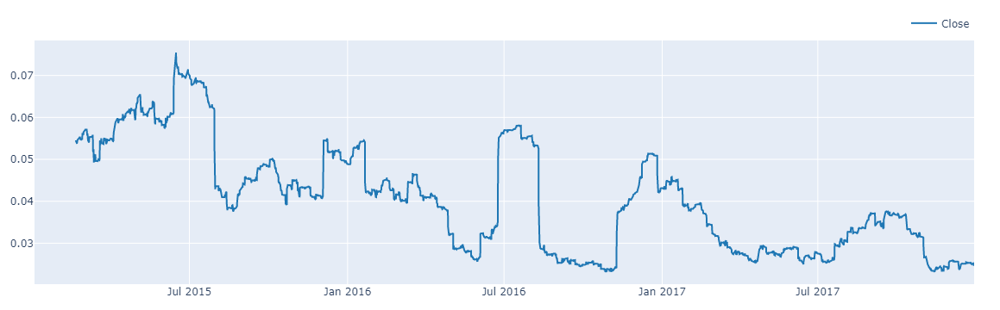

In [34]:
dfsw1 = strategy(dfsw1)
fig = dfsw1.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl_fixRPT(dfsw1).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl_fixRPT(dfsw1).plot(subplots=['drawdowns']).show()
(np.log(dfsw1.Close/dfsw1.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility

####  Non-Trend Data 2

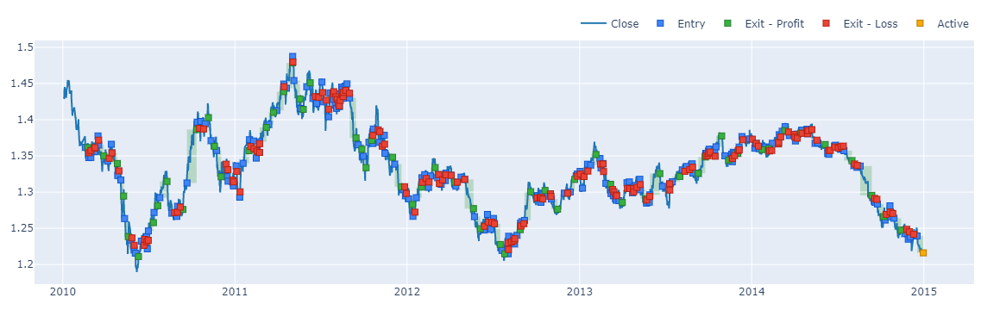

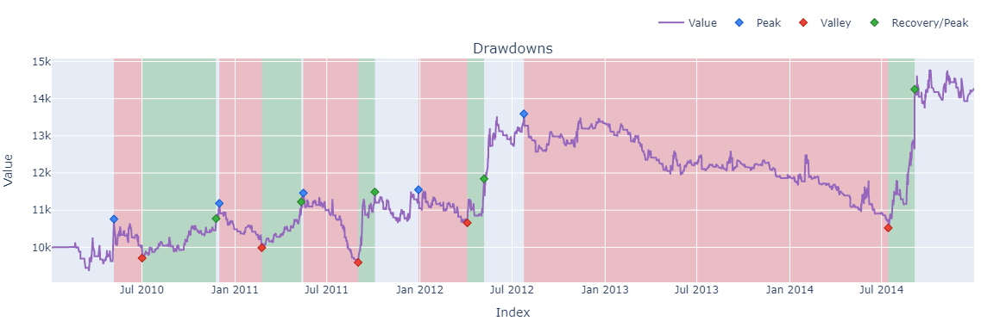

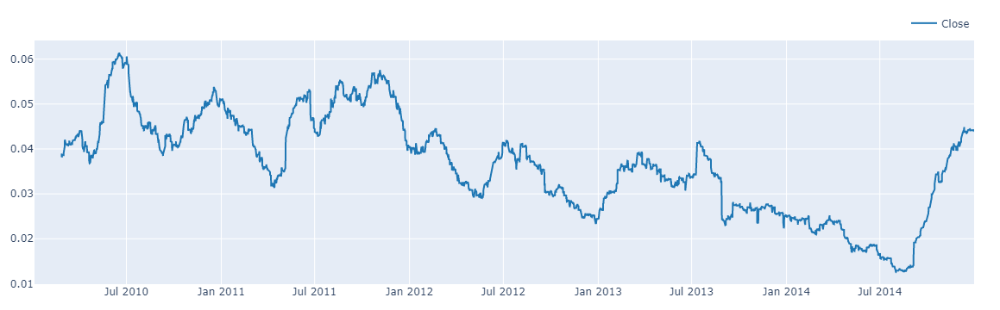

In [35]:
dfsw2 = strategy(dfsw2)
fig = dfsw2.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl_fixRPT(dfsw2).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl_fixRPT(dfsw2).plot(subplots=['drawdowns']).show()
(np.log(dfsw2.Close/dfsw2.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility